     datetime_utc  _conds   _dewptm   _fog   _hail   _heatindexm  humidity  \
0  19961101-11:00   Smoke       9.0      0       0           NaN      27.0   
1  19961101-12:00   Smoke      10.0      0       0           NaN      32.0   
2  19961101-13:00   Smoke      11.0      0       0           NaN      44.0   
3  19961101-14:00   Smoke      10.0      0       0           NaN      41.0   
4  19961101-16:00   Smoke      11.0      0       0           NaN      47.0   

    _precipm   _pressurem   _rain   _snow  temp   _thunder   _tornado   _vism  \
0        NaN       1010.0       0       0  30.0          0          0     5.0   
1        NaN      -9999.0       0       0  28.0          0          0     NaN   
2        NaN      -9999.0       0       0  24.0          0          0     NaN   
3        NaN       1010.0       0       0  24.0          0          0     2.0   
4        NaN       1011.0       0       0  23.0          0          0     1.2   

    _wdird  _wdire   _wgustm   _windchillm  

                  date  _conds   _dewptm   _fog   _hail   _heatindexm  \
0  1996-11-01 11:00:00   Smoke       9.0      0       0           NaN   
4  1996-11-01 16:00:00   Smoke      11.0      0       0           NaN   
6  1996-11-01 18:00:00   Smoke      13.0      0       0           NaN   
14 1996-11-02 02:00:00   Smoke      10.0      0       0           NaN   
15 1996-11-02 03:00:00   Smoke      10.0      0       0           NaN   

    humidity   _precipm   _pressurem   _rain  ...   _thunder   _tornado  \
0       27.0        NaN       1010.0       0  ...          0          0   
4       47.0        NaN       1011.0       0  ...          0          0   
6       60.0        NaN       1010.0       0  ...          0          0   
14      52.0        NaN       1011.0       0  ...          0          0   
15      46.0        NaN       1012.0       0  ...          0          0   

     _vism   _wdird   _wdire   _wgustm  _windchillm  wind_speed  year  month  
0      5.0    280.0     West   

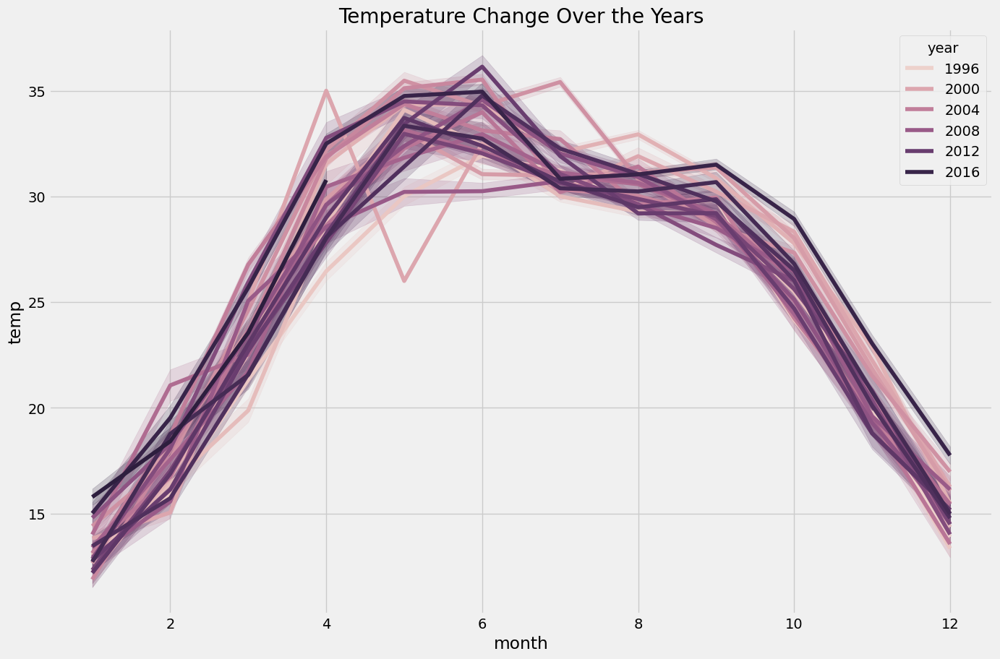

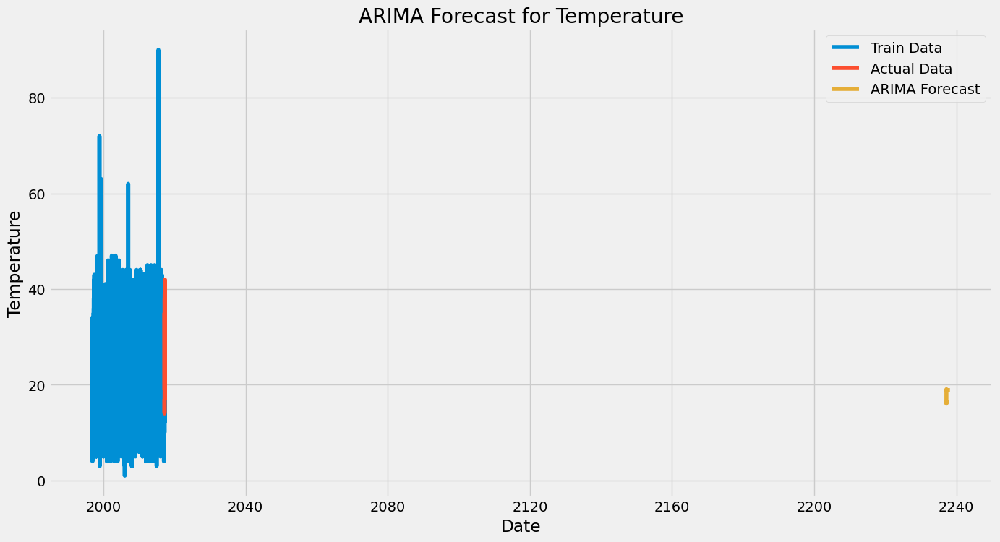

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from statsmodels.tsa.arima.model import ARIMA
import warnings

warnings.filterwarnings('ignore')

# Read the data
data = pd.read_csv("delhiweather.csv")

# Exploratory data analysis
print(data.head())
print(data.describe())
print(data.info())

# Rename columns for ease of use if necessary
data.rename(columns={
    'datetime_utc': 'date',
    'temp': 'temp',
    'humidity': 'humidity',
    ' _wspdm': 'wind_speed'
}, inplace=True)

# Remove rows with NaN values
data.dropna(subset=['date', 'temp', 'humidity', 'wind_speed'], inplace=True)

# Visualize data using Plotly Express
fig_temp = px.line(data, x="date", y="temp", title='Temperature Over the Years')
fig_temp.show()
fig_humidity = px.line(data, x="date", y="humidity", title='Humidity Over the Years')
fig_humidity.show()
fig_wind = px.line(data, x="date", y="wind_speed", title='Wind Speed Over the Years')
fig_wind.show()
fig_scatter = px.scatter(data_frame=data, x="humidity", y="temp", size="temp",
                         trendline="ols", title="Relationship Between Temperature and Humidity")
fig_scatter.show()

# Data preprocessing
data["date"] = pd.to_datetime(data["date"], format='%Y%m%d-%H:%M')
data['year'] = data["date"].dt.year
data["month"] = data["date"].dt.month
print(data.head())

# Visualize temperature change over the years
plt.style.use('fivethirtyeight')
plt.figure(figsize=(15, 10))
plt.title("Temperature Change Over the Years")
sns.lineplot(data=data, x='month', y='temp', hue='year')
plt.show()

# ARIMA Forecasting
forecast_data = data[['date', 'temp']].copy()
forecast_data.set_index('date', inplace=True)

# Splitting data into train and test
train_data = forecast_data.iloc[:-365]
test_data = forecast_data.iloc[-365:]

# Fitting ARIMA model
model = ARIMA(train_data, order=(2, 1, 2))
model_fit = model.fit()

# Forecasting
forecast_steps = 365
predictions = model_fit.forecast(steps=forecast_steps)

# Plotting the forecast
plt.figure(figsize=(15, 8))
plt.title("ARIMA Forecast for Temperature")
plt.plot(train_data.index, train_data.values, label='Train Data')
plt.plot(test_data.index, test_data.values, label='Actual Data')
plt.plot(range(len(train_data), len(train_data) + forecast_steps), predictions, label='ARIMA Forecast')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.legend()
plt.show()